In [29]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python

import io # Input/Output Module
import os # OS interfaces
import cv2 # OpenCV package
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

from urllib import request # module for opening HTTP requests
from matplotlib import pyplot as plt # Plotting library

## Library to use t-SNE plot.
from sklearn.manifold import TSNE

# Support libraries for YOLOv8 face detection model
from huggingface_hub import hf_hub_download # access to HF-hosted models
!pip install ultralytics
from ultralytics import YOLO
!pip install supervision
from supervision import Detections
from PIL import Image # image manipulation

## Library to use SVM-classifiers
from sklearn import svm

In [30]:
# params that are used throughout the notebook

FACE_SIZE = (96, 96)
FACE_SIZE_3D = (96, 96, 3)

<div style="width:100%; height:140px">
    <img src="https://www.kuleuven.be/internationaal/thinktank/fotos-en-logos/ku-leuven-logo.png/image_preview" width = 300px, heigh = auto align=left>
</div>


KUL H02A5a Computer Vision: Group Assignment 1
---------------------------------------------------------------
Student numbers: <span style="color:red"><br/>r0842089: Thibaut Deliever, <br/>r0913519: Martin Ivanchev, <br/>r0927934: Odilon Thioux (xX_FrierenLOVUR_Xx), <br/>FILL IT IN HERE: Kumar Kartikeya, <br/>r0746731: Andreh Al Warrad</span>.

The goal of this assignment is to explore more advanced techniques for constructing features that better describe objects of interest and to perform face recognition using these features. This assignment will be delivered in groups of 5 (either composed by you or randomly assigned by your TA's).

In this assignment you are a group of computer vision experts that have been invited to ECCV 2021 to do a tutorial about  "Feature representations, then and now". To prepare the tutorial you are asked to participate in a kaggle competition and to release a notebook that can be easily studied by the tutorial participants. Your target audience is: (master) students who want to get a first hands-on introduction to the techniques that you apply.

---------------------------------------------------------------
This notebook is structured as follows:
0. Data loading & Preprocessing
1. Feature Representations
2. Evaluation Metrics 
3. Classifiers
4. Experiments
5. Publishing best results
6. Discussion

Make sure that your notebook is **self-contained** and **fully documented**. Walk us through all steps of your code. Treat your notebook as a tutorial for students who need to get a first hands-on introduction to the techniques that you apply. Provide strong arguments for the design choices that you made and what insights you got from your experiments. Make use of the *Group assignment* forum/discussion board on Toledo if you have any questions.

Fill in your student numbers above and get to it! Good luck! 


<div class="alert alert-block alert-info">
<b>NOTE:</b> This notebook is just a example/template, feel free to adjust in any way you please! Just keep things organised and document accordingly!
</div>

<div class="alert alert-block alert-info">
<b>NOTE:</b> Clearly indicate the improvements that you make!!! You can for instance use titles like: <i>3.1. Improvement: Non-linear SVM with RBF Kernel.<i>
</div>
    
---------------------------------------------------------------
# 0. Data loading & Preprocessing

## 0.1. Loading data
The training set is many times smaller than the test set and this might strike you as odd, however, this is close to a real world scenario where your system might be put through daily use! In this session we will try to do the best we can with the data that we've got! 

In [31]:
# # Input data files are available in the read-only "../input/" directory

train = pd.read_csv(
    '/kaggle/input/kul-h02a5a-computer-vision-ga1-2024/train_set.csv', index_col = 0)
train.index = train.index.rename('id')

test = pd.read_csv(
    '/kaggle/input/kul-h02a5a-computer-vision-ga1-2024/test_set.csv', index_col = 0)
test.index = test.index.rename('id')

# read the images as numpy arrays and store in "img" column
train['img'] = [cv2.cvtColor(np.load('/kaggle/input/kul-h02a5a-computer-vision-ga1-2024/train/train_{}.npy'.format(index), allow_pickle=False), cv2.COLOR_BGR2RGB)
                for index, row in train.iterrows()]

test['img'] = [cv2.cvtColor(np.load('/kaggle/input/kul-h02a5a-computer-vision-ga1-2024/test/test_{}.npy'.format(index), allow_pickle=False), cv2.COLOR_BGR2RGB)
                for index, row in test.iterrows()]


train_size, test_size = len(train),len(test)

"The training set contains {} examples, the test set contains {} examples.".format(train_size, test_size)

'The training set contains 80 examples, the test set contains 1816 examples.'

*Note: this dataset is a subset of the* [*VGG face dataset*](https://www.robots.ox.ac.uk/~vgg/data/vgg_face/).

## 0.2. A first look
Let's have a look at the data columns and class distribution.

In [32]:
# The training set contains an identifier, name, image information and class label
train.head(5)

,name,class,img
id,,,
0,Mila_Kunis,2,"[[[50, 31, 25], [49, 30, 24], [49, 30, 24], [4..."
1,Mila_Kunis,2,"[[[24, 35, 31], [25, 36, 32], [27, 36, 33], [2..."
2,Michael_Cera,0,"[[[111, 112, 106], [111, 112, 106], [112, 113,..."
3,Mila_Kunis,2,"[[[223, 223, 223], [223, 223, 223], [223, 223,..."
4,Michael_Cera,0,"[[[195, 195, 205], [195, 195, 205], [190, 192,..."


In [33]:
# The test set only contains an identifier and corresponding image information.

test.head(1)

,img
id,
0,"[[[209, 210, 205], [208, 209, 204], [208, 209,..."


In [34]:
# The class distribution in the training set:
train.groupby('name').agg({'img':'count', 'class': 'max'})

,img,class
name,,
Jesse_Eisenberg,30,1
Michael_Cera,10,0
Mila_Kunis,30,2
Sarah_Hyland,10,0


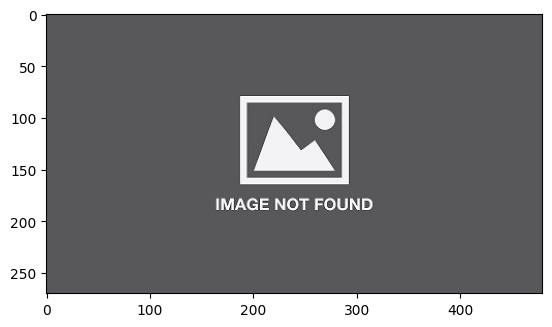

In [35]:
# false image
plt.imshow(train["img"][65])

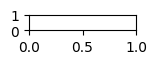

<Figure size 640x1500 with 0 Axes>

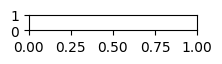

<Figure size 640x1500 with 0 Axes>

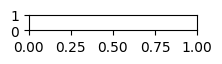

<Figure size 640x1500 with 0 Axes>

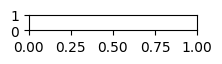

<Figure size 640x1500 with 0 Axes>

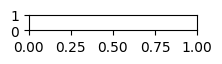

<Figure size 640x1500 with 0 Axes>

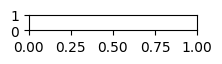

<Figure size 640x1500 with 0 Axes>

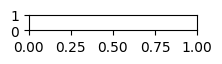

<Figure size 640x1500 with 0 Axes>

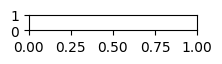

<Figure size 640x1500 with 0 Axes>

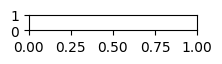

<Figure size 640x1500 with 0 Axes>

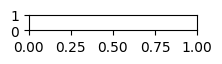

<Figure size 640x1500 with 0 Axes>

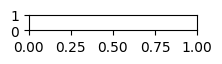

<Figure size 640x1500 with 0 Axes>

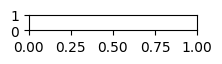

<Figure size 640x1500 with 0 Axes>

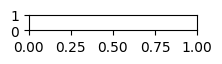

<Figure size 640x1500 with 0 Axes>

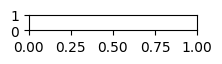

<Figure size 640x1500 with 0 Axes>

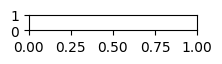

<Figure size 640x1500 with 0 Axes>

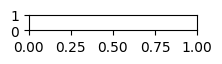

<Figure size 640x1500 with 0 Axes>

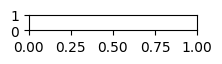

<Figure size 640x1500 with 0 Axes>

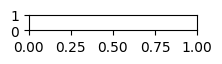

<Figure size 640x1500 with 0 Axes>

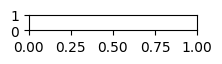

<Figure size 640x1500 with 0 Axes>

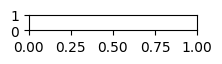

<Figure size 640x1500 with 0 Axes>

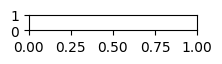

<Figure size 640x1500 with 0 Axes>

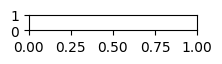

<Figure size 640x1500 with 0 Axes>

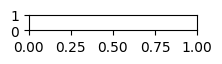

<Figure size 640x1500 with 0 Axes>

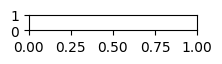

<Figure size 640x1500 with 0 Axes>

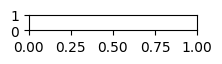

<Figure size 640x1500 with 0 Axes>

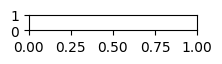

<Figure size 640x1500 with 0 Axes>

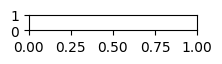

<Figure size 640x1500 with 0 Axes>

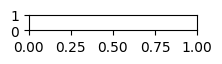

<Figure size 640x1500 with 0 Axes>

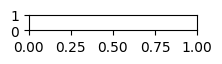

<Figure size 640x1500 with 0 Axes>

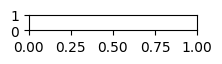

<Figure size 640x1500 with 0 Axes>

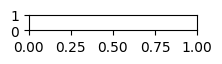

<Figure size 640x1500 with 0 Axes>

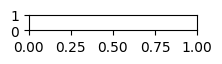

<Figure size 640x1500 with 0 Axes>

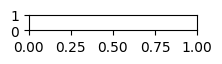

<Figure size 640x1500 with 0 Axes>

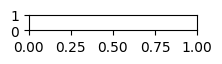

<Figure size 640x1500 with 0 Axes>

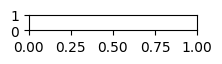

<Figure size 640x1500 with 0 Axes>

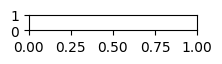

<Figure size 640x1500 with 0 Axes>

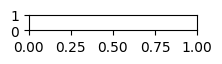

<Figure size 640x1500 with 0 Axes>

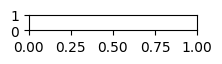

<Figure size 640x1500 with 0 Axes>

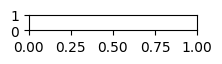

<Figure size 640x1500 with 0 Axes>

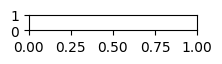

<Figure size 640x1500 with 0 Axes>

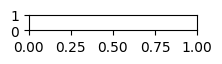

<Figure size 640x1500 with 0 Axes>

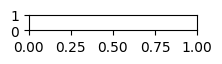

<Figure size 640x1500 with 0 Axes>

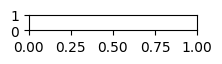

<Figure size 640x1500 with 0 Axes>

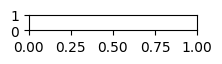

<Figure size 640x1500 with 0 Axes>

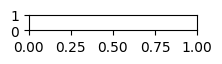

<Figure size 640x1500 with 0 Axes>

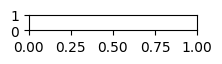

<Figure size 640x1500 with 0 Axes>

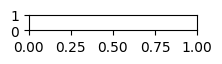

<Figure size 640x1500 with 0 Axes>

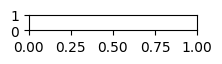

<Figure size 640x1500 with 0 Axes>

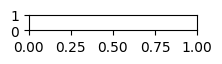

<Figure size 640x1500 with 0 Axes>

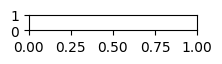

<Figure size 640x1500 with 0 Axes>

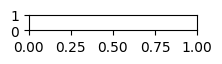

<Figure size 640x1500 with 0 Axes>

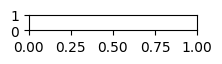

<Figure size 640x1500 with 0 Axes>

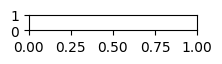

<Figure size 640x1500 with 0 Axes>

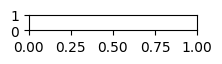

<Figure size 640x1500 with 0 Axes>

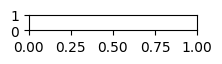

<Figure size 640x1500 with 0 Axes>

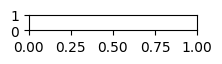

<Figure size 640x1500 with 0 Axes>

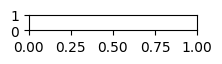

<Figure size 640x1500 with 0 Axes>

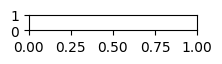

<Figure size 640x1500 with 0 Axes>

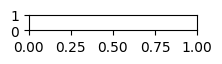

<Figure size 640x1500 with 0 Axes>

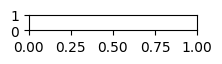

<Figure size 640x1500 with 0 Axes>

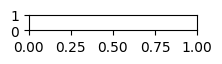

<Figure size 640x1500 with 0 Axes>

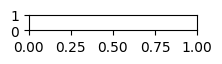

<Figure size 640x1500 with 0 Axes>

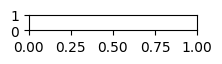

<Figure size 640x1500 with 0 Axes>

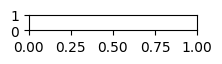

<Figure size 640x1500 with 0 Axes>

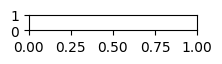

<Figure size 640x1500 with 0 Axes>

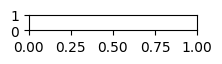

<Figure size 640x1500 with 0 Axes>

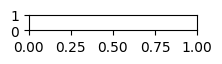

<Figure size 640x1500 with 0 Axes>

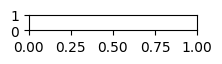

<Figure size 640x1500 with 0 Axes>

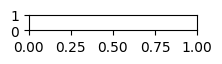

<Figure size 640x1500 with 0 Axes>

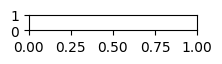

<Figure size 640x1500 with 0 Axes>

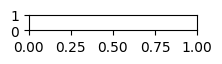

<Figure size 640x1500 with 0 Axes>

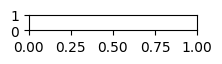

<Figure size 640x1500 with 0 Axes>

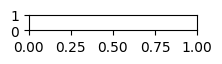

<Figure size 640x1500 with 0 Axes>

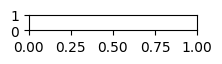

<Figure size 640x1500 with 0 Axes>

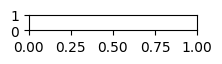

<Figure size 640x1500 with 0 Axes>

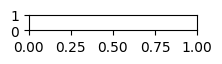

<Figure size 640x1500 with 0 Axes>

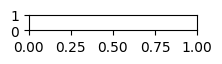

<Figure size 640x1500 with 0 Axes>

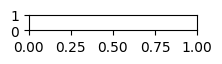

<Figure size 640x1500 with 0 Axes>

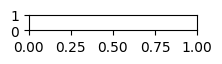

<Figure size 640x1500 with 0 Axes>

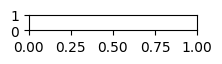

<Figure size 640x1500 with 0 Axes>

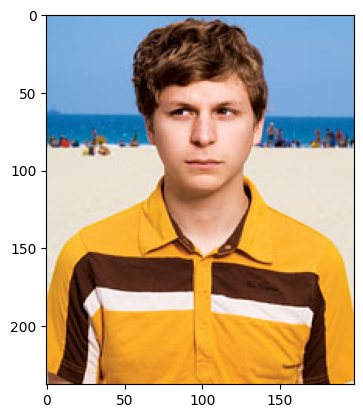

In [36]:
# Visual data exploration
# Some images have more than one face
# Some images have text over the face

for i in range(80):
    plt.subplot(20, 4, i+1)
    plt.figure().set_figheight(15)
    plt.figure().set_figwidth(10)
    plt.imshow(train["img"][i])

Note that **Jesse is assigned the classification label 1**, and **Mila is assigned the classification label 2**. The dataset also contains 20 images of **look alikes (assigned classification label 0)** and the raw images. 

## 0.3. Preprocess data
### 0.3.1 Example: HAAR face detector
In this example we use the [HAAR feature based cascade classifiers](https://opencv-python-tutroals.readthedocs.io/en/latest/py_tutorials/py_objdetect/py_face_detection/py_face_detection.html) to detect faces, then the faces are resized so that they all have the same shape. If there are multiple faces in an image, we only take the first one. 

<div class="alert alert-block alert-info"> <b>NOTE:</b> You can write temporary files to <code>/kaggle/temp/</code> or <code>../../tmp</code>, but they won't be saved outside of the current session
</div>


In [37]:
class HAARPreprocessor():
    """Preprocessing pipeline built around HAAR feature based cascade classifiers. """
    
    def __init__(self, path, face_size):
        self.face_size = face_size
        file_path = os.path.join(path, "haarcascade_frontalface_default.xml")
        if not os.path.exists(file_path): 
            if not os.path.exists(path):
                os.mkdir(path)
            self.download_model(file_path)
        
        self.classifier = cv2.CascadeClassifier(file_path)
  
    def download_model(self, path):
        url = "https://raw.githubusercontent.com/opencv/opencv/master/data/"\
            "haarcascades/haarcascade_frontalface_default.xml"
        
        with request.urlopen(url) as r, open(path, 'wb') as f:
            f.write(r.read())
            
    def detect_faces(self, img):
        """Detect all faces in an image."""
        
        img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        return self.classifier.detectMultiScale(
            img_gray,
            scaleFactor=1.2,
            minNeighbors=5,
            minSize=(30, 30),
            flags=cv2.CASCADE_SCALE_IMAGE
        )
        
    def extract_faces(self, img):
        """Returns all faces (cropped) in an image."""
        
        faces = self.detect_faces(img)

        return [img[y:y+h, x:x+w] for (x, y, w, h) in faces]
    
    def preprocess(self, data_row):
        faces = self.extract_faces(data_row['img'])
        
        # if no faces were found, return None
        if len(faces) == 0:
            nan_img = np.empty(self.face_size + (3,))
            nan_img[:] = np.nan
            return nan_img
        
        # only return the first face
        return cv2.resize(faces[0], self.face_size, interpolation = cv2.INTER_AREA)
            
    def __call__(self, data):
        return np.stack([self.preprocess(row) for _, row in data.iterrows()]).astype(int)

In [38]:
class HAARPreprocessorEyes:
    """HAAR cascade classifier for handling eye detection."""
    
    def __init__(self, path, face_size, scaleFactor=1.2, minN=5, minS=(30,30)):
        self.face_size = face_size
        self.scaleFactor = scaleFactor
        self.minN = minN
        self.minS = minS
        file_path = os.path.join(path, "haarcascade_eye.xml")
        if not os.path.exists(file_path): 
            if not os.path.exists(path):
                os.mkdir(path)
            self.download_model(file_path)
        
        self.classifier = cv2.CascadeClassifier(file_path)
  
    def download_model(self, path):
        url = "https://raw.githubusercontent.com/opencv/opencv/master/data/"\
            "haarcascades/haarcascade_eye.xml"
        
        with request.urlopen(url) as r, open(path, 'wb') as f:
            f.write(r.read())
            
    def detect_eyes(self, img):
        """Detect all eyes in an image."""
        
        img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        return self.classifier.detectMultiScale(
            img_gray,
            scaleFactor=self.scaleFactor,
            minNeighbors=self.minN,
            minSize=self.minS,
            flags=cv2.CASCADE_SCALE_IMAGE
        )

# 0.3 Improvement: Better Face Detection

HAAR feature-based cascade classifiers are susceptible to both false negatives and false positives. In particular, there were many faces that were not found using the default hyperparameters for the HAARPreprocessor. Even with parameter tuning to reduce the number of these false negatives, many returned crops were not actually faces, but other parts of the image. These poor returns would certainly harm classifier performance.

As a replacement, we considered a more powerful approach, but one that still did not take up too much memory (the model is just over 8MB). The replacement is the popular You Only Look Once (YOLO) v8 model. Our model is specifically fine-tuned for face detection: https://huggingface.co/arnabdhar/YOLOv8-Face-Detection.

The face detection is much more reliable, but does incur a time cost.

In [39]:
class YOLOPreprocessor():
    """Preprocessing pipeline wrapping YOLOv8 fine-tuned for face detection."""

    def __init__(self, model_path, face_size=(100, 100)):
        """
        :param model_path: path to `supervision` YOLO-compatible PyTorch model
        :param face_size: standard height and width for face crops
        """
        self.model = YOLO(model_path)
        self.face_size = face_size

    def get_faces(self, image, max_faces=1):
        """
        :param image: the image in which to search for a face
        :param max_faces: maximum number of faces to return
        :returns: face crop(s) of `image` if found and the bounds, `None` otherwise
        """
        output = self.model(Image.fromarray(np.uint8(image)))
        results = Detections.from_ultralytics(output[0])
        if len(results) == 0:
            return None
        faces = []
        bounds = []
        for i in range(min(len(results), max_faces)):
            x1, y1, x2, y2 = int(results.xyxy[i][0]), int(results.xyxy[i][1]), int(results.xyxy[i][2]), int(results.xyxy[i][3])
            face = image[y1:y2, x1:x2]
            face = cv2.resize(face, self.face_size, interpolation=cv2.INTER_AREA)
            faces.append(face)
            bounds.append((x1, y1, x2, y2))
        return faces, bounds

In [40]:
def plot_image_sequence(data, n, imgs_per_row=7):
    n_rows = 1 + int(n / (imgs_per_row + 1))
    n_cols = min(imgs_per_row, n)

    f, ax = plt.subplots(n_rows, n_cols, figsize=(10 * n_cols, 10 * n_rows))
    for i in range(n):
        if n == 1:
            ax.imshow(data[i])
        elif n_rows > 1:
            ax[int(i/imgs_per_row),int(i%imgs_per_row)].imshow(data[i])
        else:
            ax[int(i%n)].imshow(data[i])
    plt.show()

In [41]:
#print(hf_hub_download(repo_id="arnabdhar/YOLOv8-Face-Detection", filename="model.pt"))
prep = YOLOPreprocessor(hf_hub_download(repo_id="arnabdhar/YOLOv8-Face-Detection", filename="model.pt"))
#prep = YOLOPreprocessor("models/model.pt", face_size=FACE_SIZE)

train_faces = []
train_bounds = []
train_to_remove = []
train_counter = 0
for id, image in zip(train.index, train["img"]):
    result = prep.get_faces(image)
    if result is None:
        train_counter += 1
        train_to_remove.append(id)
        print(f"No face: {train_counter}")
        continue
    f, b = result
    train_faces.extend(f)
    train_bounds.extend(b)
print(f"No face: {train_counter}")


0: 640x480 4 FACEs, 125.8ms
Speed: 4.7ms preprocess, 125.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 480)

0: 640x448 1 FACE, 108.3ms
Speed: 3.8ms preprocess, 108.3ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 448)

0: 640x480 1 FACE, 104.8ms
Speed: 2.6ms preprocess, 104.8ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)

0: 640x480 1 FACE, 111.2ms
Speed: 2.5ms preprocess, 111.2ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 480)

0: 480x640 1 FACE, 105.5ms
Speed: 2.2ms preprocess, 105.5ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

0: 640x448 1 FACE, 103.6ms
Speed: 2.4ms preprocess, 103.6ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 448)

0: 640x448 1 FACE, 101.3ms
Speed: 2.2ms preprocess, 101.3ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 448)

0: 448x640 1 FACE, 101.0ms
Speed: 1.9ms preprocess, 101.0ms inference, 0.9ms postprocess per image at shape (1, 3, 4

In [42]:
test_faces = []
test_bounds = []
test_counter = 0
for id, image in zip(test.index, test["img"]):
    result = prep.get_faces(image)
    if result is None:
        test_counter += 1
        # add empty image when test face couldn't be found
        # cannot be removed like in training set
        test_faces.append(np.zeros(FACE_SIZE_3D, dtype=np.uint8))
        test_bounds.append(-1)
        print(f"No face: {test_counter}")
        continue
    f, b = result
    test_faces.extend(f)
    test_bounds.extend(b)
print(f"No face: {test_counter}")


0: 640x448 1 FACE, 106.6ms
Speed: 3.4ms preprocess, 106.6ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 448)

0: 640x416 1 FACE, 97.4ms
Speed: 2.2ms preprocess, 97.4ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 416)

0: 480x640 1 FACE, 113.9ms
Speed: 2.5ms preprocess, 113.9ms inference, 1.2ms postprocess per image at shape (1, 3, 480, 640)

0: 640x448 1 FACE, 105.5ms
Speed: 2.9ms preprocess, 105.5ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 448)

0: 640x448 1 FACE, 103.7ms
Speed: 2.6ms preprocess, 103.7ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 448)

0: 384x640 1 FACE, 90.6ms
Speed: 2.2ms preprocess, 90.6ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

0: 640x512 1 FACE, 114.5ms
Speed: 2.8ms preprocess, 114.5ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 512)

0: 640x448 5 FACEs, 104.1ms
Speed: 2.4ms preprocess, 104.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 

In [43]:
post_train = train.drop(train_to_remove)
post_train["face"] = train_faces
test["face"] = test_faces
train = post_train

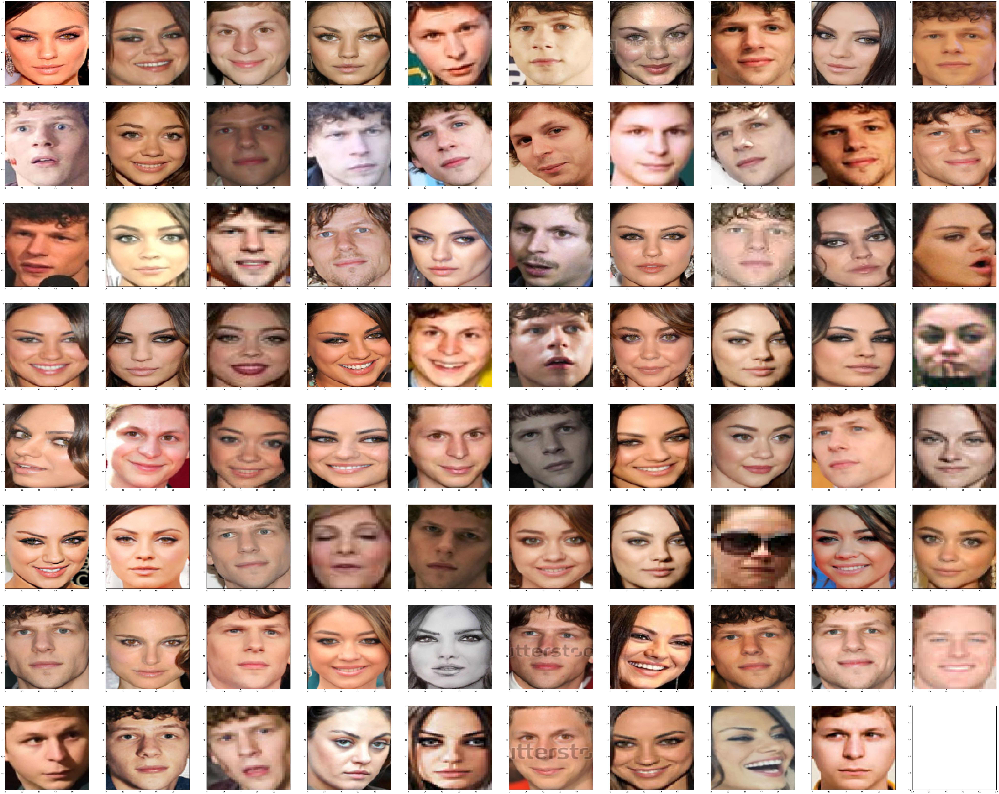

In [44]:
plot_image_sequence(train_faces, n=len(train_faces), imgs_per_row=10)

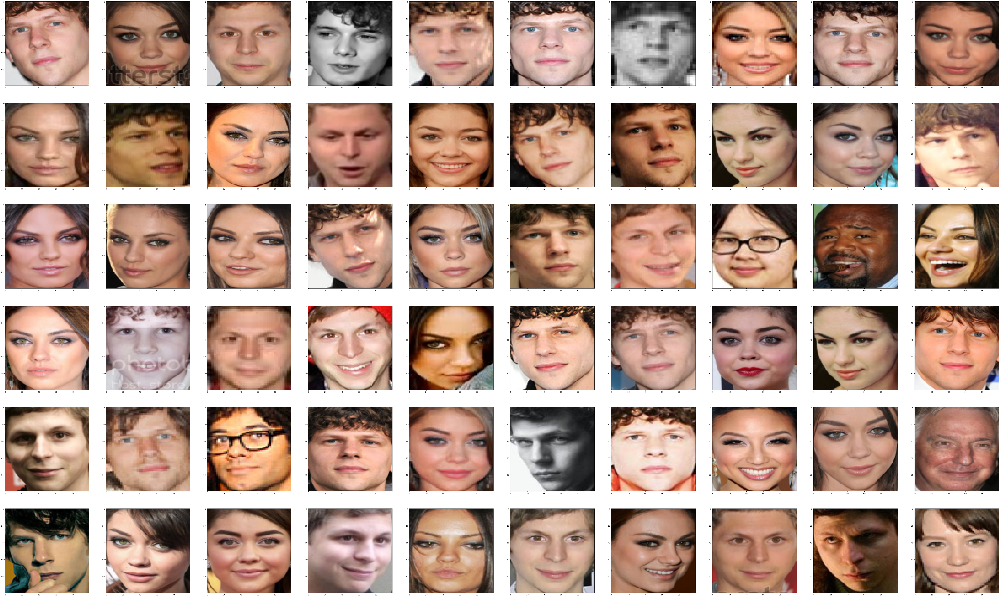

In [45]:
# cannot plot full test set, n must be < len(test_faces)
plot_image_sequence(test_faces, n=60, imgs_per_row=10)

## 0.3.2 Improvement: Data Augmentation

Due to the low number of training samples, it is important that we ensure our images will be as representative as possible of the real data. One problem of the vanilla data is face orientation. The way an actor looks on a given day may only be captured from one direction, with the head tilted right.

This limits the capabilities of the handcrafted features to generalize that appearance. In an effort to improve that capability, we perform two addition preprocessing steps. The first is to orient the face of the crop approximately vertical based on the horizontal Sobel filter. The second is to duplicate all the faces with a mirrored counterpart.

In [46]:
def get_straights(eye_finder, faces, bounds, originals, face_size):
    """
    Straighten face crops for standard training and testing data.

    :param eye_finder: the preprocessor for finding eyes in the crops
    :param faces: the face crops
    :param bounds: the respective bounds of the face crops
    :param originals: the original images the faces were cropped from
    :param face_size: final size the face crops should be
    :returns: rotated face crops without black borders
    """
    straights = []
    for i, face in enumerate(faces):
        # check if this is an empty image
        if bounds[i] == -1:
            straights.append(face)
            continue

        # get eye coordinates
        eyes = eye_finder.detect_eyes(face)

        # if two eyes not found, just use original crop
        if len(eyes) != 2:
            #straights.append(face)
            straights.append(face)
            continue
        
        # get the centers of the found eyes
        centers = []
        for (x, y, w, h) in eyes:
            eye_center = (x + w//2, y + h//2)
            centers.append(eye_center)

        # calculate the angle of the eye plane
        angle = np.arctan2(centers[1][1] - centers[0][1], centers[1][0] - centers[0][0])
        degrees = np.degrees(angle)

        # assumption that eyes are closest to normal orientation
        # and smallest change in that direction is necessary
        if degrees > 270:
            rot_angle = 360 - degrees
        elif degrees > 90:
            rot_angle = degrees - 180
        elif degrees < -270:
            rot_angle = 360 + degrees
        elif degrees < -90:
            rot_angle = degrees + 180
        else:
            rot_angle = degrees

        # get rotmax based on face center in original image
        image_center = tuple(np.array(face.shape[1::-1]) / 2)
        face_center = (image_center[0] + bounds[i][0], image_center[1] + bounds[i][1])
        rotation_matrix = cv2.getRotationMatrix2D(face_center, rot_angle, 1.0)

        # get rotated face
        original_rotated = cv2.warpAffine(originals[i], rotation_matrix, originals[i].shape[1::-1], flags=cv2.INTER_LINEAR)
        x1, y1, x2, y2 = bounds[i]
        result = original_rotated[y1:y2, x1:x2]
        result = cv2.resize(result, face_size, interpolation=cv2.INTER_AREA)

        #straights.append(face)
        straights.append(result)
    return straights

In [47]:
# for eyes
p = HAARPreprocessorEyes(path='../../tmp', face_size=FACE_SIZE, scaleFactor=1.05, minN=5, minS=(5, 5))

train_straights = get_straights(p, train_faces, train_bounds, train["img"].values, FACE_SIZE)
test_straights = get_straights(p, test_faces, test_bounds, test["img"].values, FACE_SIZE)
    
#plot_image_sequence(straights, n=len(straights), imgs_per_row=10)

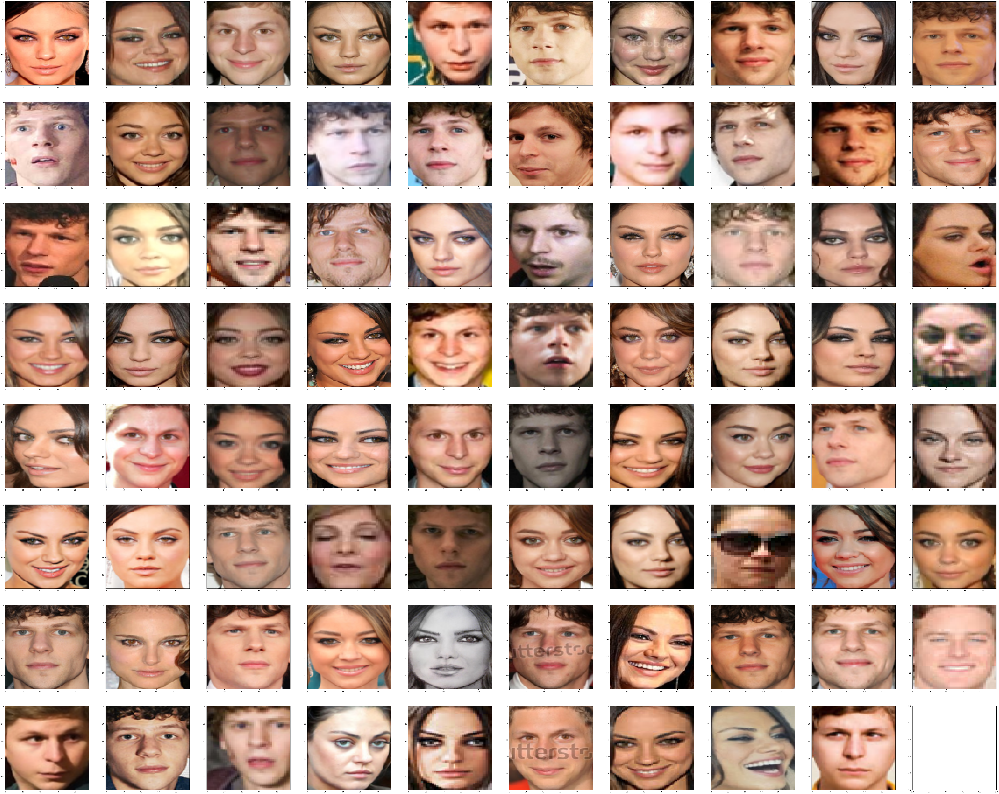

In [48]:
plot_image_sequence(train_straights, n=len(train_straights), imgs_per_row=10)

In [49]:
plot_image_sequence(test_straights, n=len(test_straights), imgs_per_row=10)

IndexError: index 166 is out of bounds for axis 0 with size 166

Error in callback <function _draw_all_if_interactive at 0x78f9dac4f130> (for post_execute), with arguments args (),kwargs {}:


ValueError: Image size of 10000x166000 pixels is too large. It must be less than 2^16 in each direction.

ValueError: Image size of 10000x166000 pixels is too large. It must be less than 2^16 in each direction.

<Figure size 10000x166000 with 1660 Axes>

In [ ]:
# only mirror the training data
mirrored = []
for face in train_straights:
    mirrored.append(cv2.flip(face, 1))
train_straights.extend(mirrored)

In [ ]:
train = pd.concat([train, train], ignore_index=True)
train["face"] = train_straights

In [ ]:
plot_image_sequence(train_straights, n=len(train_straights), imgs_per_row=10)

In [ ]:
test["face"] = test_straights

In [ ]:
train_X = np.stack(train["face"].values).astype(int)
test_X = np.stack(test["face"].values).astype(int)
train_y = train["class"].values

**Visualise**

Let's plot a few examples.

In [ ]:
# plot faces of Michael and Sarah

plot_image_sequence(train_X[train_y == 0], n=20*2, imgs_per_row=10)

In [ ]:
# plot faces of Jesse
plot_image_sequence(train_X[train_y == 1], n=30*2, imgs_per_row=10)

In [ ]:
# plot faces of Mila
plot_image_sequence(train_X[train_y == 2], n=30*2, imgs_per_row=10)

## 0.4. Store Preprocessed data (optional)
<div class="alert alert-block alert-info">
<b>NOTE:</b> You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All". Feel free to use this to store intermediary results.
</div>

In [ ]:
# save preprocessed data
# prep_path = '/kaggle/working/prepped_data/'
# if not os.path.exists(prep_path):
#     os.mkdir(prep_path)
    
# np.save(os.path.join(prep_path, 'train_X.npy'), train_X)
# np.save(os.path.join(prep_path, 'train_y.npy'), train_y)
# np.save(os.path.join(prep_path, 'test_X.npy'), test_X)

# load preprocessed data
# prep_path = '/kaggle/working/prepped_data/'
# if not os.path.exists(prep_path):
#     os.mkdir(prep_path)
# train_X = np.load(os.path.join(prep_path, 'train_X.npy'))
# train_y = np.load(os.path.join(prep_path, 'train_y.npy'))
# test_X = np.load(os.path.join(prep_path, 'test_X.npy'))

Now we are ready to rock!

# 1. Feature Representations
## 1.0. Example: Identify feature extractor
Our example feature extractor doesn't actually do anything... It just returns the input:
$$
\forall x : f(x) = x.
$$

It does make for a good placeholder and baseclass ;).

In [ ]:
class IdentityFeatureExtractor:
    """A simple function that returns the input"""
    
    def transform(self, X):
        return X
    
    def __call__(self, X):
        return self.transform(X)

## 1.1. Baseline 1: HOG feature extractor
### 1.1.0. Introduction & Context
#### What is ML and how do we apply it in this context?
Machine Learning extends far beyond fancy Artificial Intelligence mathematics. In fact, Machine Learning still heavily relies on human interaction to create models, perform preprocessing, interpret data... In this project, we aim to generate outputs of 0, 1, or 2 based on training data (photos containing faces of individuals). Here, 1 represents Jesse Eisenberg, 2 represents Mila Kunis, and 0 represents neither. With a training set consisting of photos and their corresponding correct outputs, we can train a model capable of making predictions for new, unseen photos.

The input here specifically consists of RGB images represented as a 3-dimensional matrix. The resolution of the photos (and thus the dimension of the matrix) is not static and can vary. To address this variance, we'll perform a preprocessing step that extracts faces from the photos and returns them in a cropped form. This way, the modeling process only considers the relevant information from the photo: the face that identifies a person.

To move from input to output, each cell within the input matrix (100x100) is assigned its own weight to evaluate the correct output. In total, we're dealing with 10,000 variables in each dimension, totaling 30,000 variables per filtered face! While each pixel doesn't contain much information on its own (only local information about the intensity/color of light at a particular position), patterns in a window of pixels can be quite informative. These patterns allow us to "recognize" faces. Now, we're talking about training 30,000 variables (along with their associated weights) using a training set of 80 photos (60 correct ones of Jesse & Mila, 20 redundant), which is rather limited and sparse in number!


#### What is Feature Extraction?
Feature extraction is a crucial process in machine learning whereby an initial set of raw data undergoes transformation into a format more conducive for algorithms to process. Its aim is to reduce the resources needed to describe a large dataset effectively. When dealing with complex data, one of the primary challenges lies in the sheer number of variables involved. Analyzing data with a high number of variables typically demands significant memory and computational power, and it may lead to classification algorithms overfitting to training samples while poorly generalizing to new ones. Feature extraction serves as a broad term encompassing methods to address these issues by constructing combinations of variables that maintain sufficient accuracy in describing the data.

In the realm of image processing, techniques like HAAR, HOG, and PCA are utilized for feature extraction, aiming to identify the most significant features within images. These extracted features then become the basis for training the model. In our project, we start with a dataset containing 30,000 variables (individual pixels), which we aim to reduce significantly to train our model effectively. Employing methods like those mentioned above, we aim to identify a set of pertinent features that are feasible for training and yield accurate predictions. This process effectively reduces the dimensionality of the variable space, eliminating redundant or irrelevant features. Consequently, the model's performance is enhanced as it focuses solely on the most critical features.


#### What is HOG?
HOG, short for Histogram of Oriented Gradients, represents a significant feature descriptor utilized in computer vision and image processing, primarily for object detection purposes. This technique focuses on quantifying the occurrences of gradient orientation in localized parts of an image.

The fundamental concept behind HOG lies in the inference of an object's shape within an image through its gradient or edge directions. The image is partitioned into small interconnected regions known as cells. For the pixels within each cell, a histogram of gradient directions is computed, and these histograms are then concatenated to form the descriptor.

Here's a step-by-step outline of the HOG feature extraction process:

1. Image Normalization: Initially, the image undergoes normalization procedures like gamma and color normalization to mitigate the impact of illumination variations.
2. Gradient Image Calculation: Next, the image is filtered with a basic derivative filter in both horizontal and vertical directions to obtain the first derivatives.
3. Gradient Encoding: Each pixel within the cell contributes to an orientation-based histogram channel based on the gradient computation results.
4. Histogram of Gradients Creation: The gradients of pixels within each cell are utilized to construct a histogram representing gradient directions, thus generating a feature vector for that cell.
5. Histogram Normalization: Subsequently, the histograms are normalized to enhance accuracy by minimizing the influence of lighting variations.
6. Concatenation of Histograms: The descriptor comprises the normalized histograms from all block regions, forming feature vectors essential for training a machine learning model.

The advantage of HOG lies in its robustness against geometric and photometric transformations, albeit object orientation changes pose a challenge. This characteristic makes HOG a suitable choice for tasks such as pedestrian detection, where the object of interest may exhibit various poses. However, a limitation of HOG is its inability to handle changes in object orientation effectively.


#### Let's try implementing!

In [ ]:
firstImage = train_X[0]
print(firstImage.dtype, firstImage.shape)
if firstImage.dtype != 'uint8' and firstImage.dtype != 'float32':
    firstImage = cv2.convertScaleAbs(firstImage)
print(firstImage.dtype, firstImage.shape)
firstImage_g = cv2.cvtColor(firstImage, cv2.COLOR_BGR2GRAY)
print(firstImage_g.dtype, firstImage_g.shape)

When using OpenCV, images are typically represented as multi-dimensional arrays of pixel values. These pixel values can take on different data types, such as uint8, uint16, float32, and so on.

To convert an image to grayscale using OpenCV, the color information of each pixel needs to be condensed into a single intensity value. This is achieved by computing the average of the red, green, and blue color channels for each pixel. It's essential for images to be in uint8-type (8-bit unsigned integer) before converting to grayscale because grayscale intensity values range from 0 to 255. The uint8 data type can precisely represent values within this range, aligning perfectly with grayscale intensity values.

If the image isn't in uint8-type, the grayscale conversion might yield unexpected outcomes. For instance, if the image is in a different data type like float32, the resulting grayscale image may contain intensity values beyond the 0 to 255 range. This discrepancy can lead to visual anomalies or incorrect rendering of the image. To mitigate this, it's necessary to convert every image into the uint8 type beforehand. This conversion doesn't entail any data loss; rather, it's a method of representing the data differently.

In [ ]:
print(train_X.dtype, train_X.shape)
train_X = train_X.astype('uint8')
print(train_X.dtype, train_X.shape)

In [ ]:
print(test_X.dtype, test_X.shape)
test_X = test_X.astype('uint8')
print(test_X.dtype, test_X.shape)

### 1.1.1. Implementation of the HOG Feature Extractor

Now that everything is set and ready to proceed, let's delve into implementing the HOG Feature Extractor within a single class. Our aim is to extract features from a dataset of images. To achieve this, we will construct a class that encompasses a function to be applied to a single image, along with another function to extend this process to an entire dataset of images.

Before proceeding with feature extraction, we need to preprocess the images and adjust the width-to-height ratio to 1:2. Ideally, the image size should be 64 x 128, as we'll be dividing the image into patches of 8 x 8 and 16 x 16 to extract features. Maintaining this specified size (64 x 128) simplifies our calculations. While the standard size is used in papers and research, we'll work with 96 x 96 images since resizing leads to information loss.

The HOG Extractor involves various hyperparameters:
- Window Size: Determines the size of the detection window.
- Block Size: Specifies the size of the block.
- Block Stride: Sets the stride of the block.
- Cell Size: Specifies the size of the cell.
- Number of Bins: Indicates the number of bins used for the histogram.

In [ ]:
class HOGFeatureExtractor(IdentityFeatureExtractor):
    """
    This class represents a feature extractor based on Histogram of Oriented Gradients (HOG) algorithm.
    It inherits from the IdentityFeatureExtractor class.

    Attributes:
        win_size (tuple): The size of the detection window (width, height).
        block_size (tuple): The size of the block (width, height).
        block_stride (tuple): The stride of the block (width, height).
        cell_size (tuple): The size of the cell (width, height).
        nbins (int): The number of bins for the histogram.

    Methods:
        __init__(windowSize, blockSize, blockStride, cellSize, nBins): Initializes a HOGFeatureExtractor object with the specified parameters.
        constructHOGDescriptor(): Constructs a Histogram of Oriented Gradients (HOG) descriptor using the specified parameters.
        transform(X): Transforms an input image X into HOG features.
        transformDataset(X): Transforms a dataset of images X into HOG features.
    """

    def __init__(self, windowSize, blockSize, blockStride, cellSize, nBins):
        """
        Initializes a HOGFeatureExtractor object with the specified parameters.

        Args:
            windowSize (tuple): The size of the detection window (width, height).
            blockSize (tuple): The size of the block (width, height).
            blockStride (tuple): The stride of the block (width, height).
            cellSize (tuple): The size of the cell (width, height).
            nBins (int): The number of bins for the histogram.
        """
        self.win_size = windowSize
        self.block_size = blockSize
        self.block_stride = blockStride
        self.cell_size = cellSize
        self.nbins = nBins
        self.HOG = cv2.HOGDescriptor(windowSize, blockSize, blockStride, cellSize, nBins)


    def constructHOGDescriptor(self):
        """
        Constructs a Histogram of Oriented Gradients (HOG) descriptor using the specified parameters.

        Returns:
            HOGDescriptor: The constructed HOG descriptor.
        """
        HOG = cv2.HOGDescriptor(self.win_size, self.block_size, self.block_stride, self.cell_size, self.nbins)
        return HOG


    def transform(self, X):
        """
        Transforms an input image X into HOG features.
        We assume that the input image is in BGR format of type uint8.

        Args:
            X (numpy.ndarray): The input image.

        Returns:
            numpy.ndarray: The HOG features of the input image.
        """
        gray = cv2.cvtColor(X, cv2.COLOR_BGR2GRAY)
        features = self.HOG.compute(gray)
        return features


    def transformDataset(self, X):
        """
        Transforms a dataset of images X into HOG features.

        Args:
            X (numpy.ndarray): The input dataset of images.

        Returns:
            numpy.ndarray: The HOG features of the input dataset.
        """
        features = np.array(list(map(self.transform, X)))
        return features


    def __call__(self, X):
        """
        Apply the transformation to the input data.

        Parameters:
        X (array-like): The input data to be transformed.

        Returns:
        array-like: The transformed data.
        """
        return self.transformDataset(X)

### 1.1.2. Considerations
- HOG Extractors operate on grayscale images. Hence, we need to convert all processed images to grayscale before extracting potential features.
- The output will comprise a list of features rather than images. Therefore, specific classifiers must be trained to differentiate between these features and predict potential outputs.

### 1.1.3. Testing the HOG Feature Extractor
With the implementation of the [section above](#1.1.1.-Implementation-of-the-HOG-Feature-Extractor), we can now experiment and test various hyperparameters of the HOG Feature Extractor for our Computer Vision project.

In [ ]:
hogExtractor = HOGFeatureExtractor((16, 16), (8, 8), (4, 4), (4, 4), 8) 
print(f"train_X meta: {train_X.dtype}, {train_X.shape}")
print(f"train_X[0] meta: {train_X[0].dtype}, {train_X[0].shape}")

features_trainX0 = hogExtractor.transform(train_X[0])
print(f"features of train_X[0] meta: {type(features_trainX0)}, {features_trainX0.dtype}, {features_trainX0.shape}")
print()

print(f"train_X meta: {train_X.dtype}, {train_X.shape}")
HOG_features_trainX = hogExtractor.transformDataset(train_X)
print(f"HOG_features_trainX meta: {HOG_features_trainX.dtype}, {HOG_features_trainX.shape}")

#### What Do We See?

We've opted for the following configuration:
- Window Size: 16x16.
- Block Size: 8x8.
- Block Stride: 4x4.
- Cell Size: 4x4.
- Number of Bins: 8.

For each image, we've reduced the variable space from 27648 (96x96x3) to only 4356. By training a classifier on these 4356 features rather than the original 27648 pixels, we significantly increase the likelihood of developing an accurate model for predicting new images. This implies that we can train the model using 4356 weights instead of the initial 27648.

### 1.1.4. t-SNE Plots
#### What is it?
t-SNE (t-distributed Stochastic Neighbor Embedding) is a technique for reducing the dimensionality of data. Here we are applying it to visualize the features extracted from the HOG feature extractor.


#### How It works?
- Compute similarities in high dimension: typically this is done by using a gaussian distribution to measure the similarity between data points using their distance.
- Construct probability distribution: this distribution gives high probabilities to data points with high similarities.
- Create an initial plot: this plot typically contains random low dimension data.
- Optimize lower dimension embedding: iteratively adjust the low dimension data such that similarities in the lower dimension space reflect the probability distribution calculated for the similarities between data points in the higher dimension space.


#### What does it show? What doesn't it show?
t-SNE shows clusters which reflect local structure; nearby data points in the lower dimension space are likely to be nearby in the original higher dimension space as well.
t-SNE clusters do not reflect global structure; far apart data points in the lower dimension space are not necessarily far apart in the original higher dimension space.


#### Parameters.
t-SNE has many parameters, however the following are the most important:
- Perplexity: how many neighbours are used when adjusting the low dimension data. This reflects the locality of the data; higher values reflect global structures better whilest lower values reflect local structures better.
- Learning rate: the step size per iteration of the optimization process. higher values can increase speed at the cost of quality, while lower values may increase the quality at the cost of speed.

The parameters we decided to use are:
- Perplexity = 5.
- learning rate: 5.

In [ ]:
# The colors used on the tsne-plot to identify classes.
class_colors = {
    0: 'red',
    1: 'blue',
    2: 'green',
}

# Making sure that all HOG features are of the same size.
features = HOG_features_trainX.reshape(-1, HOG_features_trainX.shape[1])

# Create a new tsne instance.
tsne = TSNE(perplexity=5,learning_rate=10)
# Run tsne on the extracted features.
hogTsne = tsne.fit_transform(features)


colors = [class_colors[label] for label in train["class"]]

# # Create the legend.
plt.figure(figsize=(8, 6))
for class_label in class_colors:
    plt.scatter([], [], c=class_colors[class_label], label=f'Class {class_label}')
plt.legend()


plt.scatter(hogTsne[:, 0], hogTsne[:, 1], c=colors, s=10)
plt.title('TSNE Visualization of HOG Descriptors')
plt.xlabel('TSNE Component 1')
plt.ylabel('TSNE Component 2')
plt.grid(True)
plt.show()



### 1.1.2. Discussion
...

## 1.2. Baseline 2: PCA feature extractor
...

In [ ]:
from sklearn.decomposition import PCA

class PCAFeatureExtractor(IdentityFeatureExtractor):
    
    def __init__(self, n_components):
        """
        Initialize the PCAFeatureExtractor.

        Args:
            n_components (int): Number of principal components to retain.
            svd_solver: Singular value decomposition solver to use. // Maybe explain this better haha
            whiten (bool): Set mean to zero and variance to unity for each feature dimension
        """
        self.n_components = n_components
        self.pca = PCA(n_components = n_components, svd_solver = "auto", whiten = False)
        self.pca.n_components = n_components
        
    def transform(self, X):
        """
        Transform the input data using PCA.

        Args:
            X (np.ndarray): Input data matrix (each row represents an image).

        Returns:
            np.ndarray: Transformed data matrix with reduced dimensionality.
        """
        
        self.pca.fit(X)

        X_transformed = self.pca.transform(X)
        return X_transformed
        
    def inverse_transform(self, X):
        """
        Inverse transform the reduced data back to the original space.

        Args:
            X (np.ndarray): Reduced data matrix.

        Returns:
            np.ndarray: Original data matrix.
        """
        X_original = self.pca.inverse_transform(X)
        X_original = X_original + np.mean(X, axis=0)
        return X_original

    def eigenfaces(self):
        return self.pca.components_

    def explained_variance(self):
        return self.pca.explained_variance_

    def explained_variance_ratio(self):
        return self.pca.explained_variance_ratio_

In [ ]:
def rgb_to_bnw(images):
    bnw_images = np.empty((images.shape[0], images.shape[1], images.shape[2]))

    for i in range(images.shape[0]):
        # Convert RGB image to grayscale using cv2.cvtColor()
        bnw_image = cv2.cvtColor(images[i], cv2.COLOR_BGR2GRAY)
        bnw_images[i] = bnw_image

    return bnw_images
    
num_samples, height, width, channels = train_X.shape
bnw_trainX = rgb_to_bnw(train_X)

n_components = 40
X_flattened = bnw_trainX.reshape(num_samples, -1)
X_centered = X_flattened - np.mean(X_flattened, axis=0)

# use the PCAFeatureExtractor
pcaExtractor = PCAFeatureExtractor(n_components)
pca_features_trainX = pcaExtractor.transform(X_centered)
print(f"features_train_X meta: {pca_features_trainX.dtype}, {pca_features_trainX.shape}")

print(pca_features_trainX.shape)

plt.figure(figsize = (18,7))
plt.plot(pcaExtractor.explained_variance_ratio().cumsum(), lw=3)

### 1.2.1. Eigenface Plots
...

In [ ]:
eigenfaces = pcaExtractor.eigenfaces()

n_rows = 8
n_cols = eigenfaces.shape[0]//n_rows
fig = plt.figure(figsize=(20,20))
for i in range(eigenfaces.shape[0]):
    ax = fig.add_subplot(n_rows,n_cols, i+1, xticks=[], yticks=[])
    ax.imshow(eigenfaces[i].reshape((100,100)), cmap=plt.cm.bone)
    ax.set_title(f"Eigenface {i+1}", fontsize=20)

### 1.2.2. Feature Space Plots
...

In [ ]:
unique_labels = np.array([0,1,2])

# Plot each class separately
fig = plt.figure(figsize=(8, 6))
for label in unique_labels:
    # Select data points corresponding to the current class
    class_indices = np.where(train_y == label)[0]
    class_data_pca = pca_features_trainX[class_indices]
    
    # Plot the data points of the current class with a different color
    plt.scatter(class_data_pca[:, 0], class_data_pca[:,2], label=f'Class {label}')

plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('Projection of Faces onto 2D Eigenfaces')
plt.legend()
plt.show()

### Another approach to PCA (Singular Value Decomposition)

In [ ]:
# Feature normalization 
def featureNormalize(X):
    mu = np.mean(X, axis=0)
    sigma = np.std(X, axis = 0)
    X_norm = (X - mu)/sigma

    return X_norm, mu, sigma

def myPCA(X):
    m, n = X.shape
    cov_matrix = 1/m * X.T @ X
    U, S, V = np.linalg.svd(cov_matrix)
    return U, S, V

# WARNING
## WARNING
### WARNING

Will take F O U R minutes. You have been warned!


In [ ]:
print("Training X shape:", X_flattened.shape)
X_norm, mu, sigma = featureNormalize(X_flattened)
U, S, V = myPCA(X_norm)

In [ ]:
U_reduced = U[:, :80].T
fig,ax = plt.subplots(5,8,figsize=(20,20))
for i in range(0,40,8):
    for j in range(0,8):
        ax[int(i/8),j].imshow(U_reduced[i+j,:].reshape(100,100,order="F").T,cmap="bone")
        ax[int(i/8), j].set_title(f'Eigenface {i+j+1}')
        ax[int(i/8),j].axis("off")

In [ ]:
Z = X_norm @ U[:, :40]

unique_labels = np.array([0,1,2])

# Plot each class separately
fig = plt.figure(figsize=(8, 6))
for label in unique_labels:
    # Select data points corresponding to the current class
    class_indices = np.where(train_y == label)[0]
    class_data_pca = Z[class_indices]
    
    # Plot the data points of the current class with a different color
    plt.scatter(class_data_pca[:, 0], class_data_pca[:,5], label=f'Class {label}')

plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('Projection of Faces onto 2D Eigenfaces')
plt.legend()
plt.show()

### 1.2.3. Discussion
...

# 2. Evaluation Metrics
## 2.0. Example: Accuracy
As example metric we take the accuracy. Informally, accuracy is the proportion of correct predictions over the total amount of predictions. It is used a lot in classification but it certainly has its disadvantages...

In [ ]:
from sklearn.metrics import accuracy_score

# 3. Classifiers
## 3.0. Example: The *'not so smart'* classifier
This random classifier is not very complicated. It makes predictions at random, based on the distribution obseved in the training set. **It thus assumes** that the class labels of the test set will be distributed similarly to the training set.

In [ ]:
class RandomClassificationModel:
    """Random classifier, draws a random sample based on class distribution observed 
    during training."""
    
    def fit(self, X, y):
        """Adjusts the class ratio instance variable to the one observed in y. 

        Parameters
        ----------
        X : tensor
            Training set
        y : array
            Training set labels

        Returns
        -------
        self : RandomClassificationModel
        """
        
        self.classes, self.class_ratio = np.unique(y, return_counts=True)
        self.class_ratio = self.class_ratio / self.class_ratio.sum()
        return self
        
    def predict(self, X):
        """Samples labels for the input data. 

        Parameters
        ----------
        X : tensor
            dataset
            
        Returns
        -------
        y_star : array
            'Predicted' labels
        """

        np.random.seed(0)
        return np.random.choice(self.classes, size = X.shape[0], p=self.class_ratio)
    
    def __call__(self, X):
        return self.predict(X)
    

## 3.1. Baseline 1: SVM Classifier for HOG Feature Extractor

### 3.1.0. Introduction & Context

#### Which strategy do we use?
Classification problems inside the domain of computer vision, is mostly divided in 2 major parts:
- Binary classification: 2 to 4 binary-classifiers combined, 
- Multiclass classification: 1 multi-classifier for all.

We want to test the accuracy of the feature extractor on our testdata. But first we need to make a custom classifier strategy for it. The most easy way to implement and expand this with not a lot of labels to choose from as right now in our project. We have a set of 4 different persons which we can recognize whether or not. By making 4 distinguished individual binary classifiers that apply to our feature extractor, we can test our accuracy. Also with the limited amount of data, we are mostly obligated to use a more robust way of classification.

#### What is a SVM?
A Support Vector Machine (SVM) is a powerful machine learning algorithm used for both classification and regression tasks. It works by finding an optimal hyperplane that separates different classes of data points in a high-dimensional space. 

Here's how an SVM works:
1. Data Representation: SVMs require data to be represented as feature vectors. Each data point is represented as a vector in a multi-dimensional space, where each dimension corresponds to a specific feature or attribute of the data.
2. Class Separation: The goal of an SVM is to find a hyperplane that best separates the data points of different classes. In a binary classification scenario, the hyperplane acts as a decision boundary that maximizes the margin between the two classes. The margin is the distance between the hyperplane and the nearest data points of each class.
3. Support Vectors: Support vectors are the data points that lie closest to the decision boundary. These points play a crucial role in defining the hyperplane. SVMs only consider the support vectors when constructing the decision boundary, making them memory-efficient.
4. Kernel Trick: SVMs can handle non-linearly separable data by using a technique called the kernel trick. The kernel trick maps the original feature space into a higher-dimensional space, where the data points become linearly separable. Common kernel functions include linear, polynomial, radial basis function (RBF), and sigmoid.
5. Training: To train an SVM, you provide it with a labeled dataset, where each data point is associated with a class label. The SVM learns the optimal hyperplane by iteratively adjusting the parameters to minimize the classification error and maximize the margin.
6. Prediction: Once trained, an SVM can be used to predict the class label of new, unseen data points. It assigns a new data point to a class based on which side of the decision boundary it falls.

SVMs have several advantages, including their ability to handle high-dimensional data, their effectiveness in handling both linearly and non-linearly separable data, and their robustness against overfitting. However, SVMs can be computationally expensive for large datasets.

Based on the results of following [paper](https://ieeexplore.ieee.org/abstract/document/7482159), we made the choice to integrate an individual binary SVM classifier for each person we want to recognize which we are going to combine together as one whole 'multiclass' classifier.

#### Let's try implementing!

In [ ]:
#Create a svm Classifier
clf = svm.SVC(kernel='linear') # Linear Kernel

#Train the model using the training sets
clf.fit(HOG_features_trainX, train_y)

#Feature extraction test-data
print(f"test_X meta: {test_X.dtype}, {test_X.shape}")
HOG_features_testX = hogExtractor.transformDataset(test_X)
print(f"HOG_features_testX meta: {HOG_features_testX.dtype}, {HOG_features_testX.shape}")

#Predict the response for test dataset
print(test_X.shape)
print(HOG_features_testX.shape)
y_pred = clf.predict(HOG_features_testX)
print(y_pred.shape)


This presents a general approach for implementing the SVM classifier across the entire training dataset. Upon examination, we find that predictions for all 1816 test cases yield an array comprising 1816 predicted labels. It's crucial to ensure that the same feature pipeline employed during model training is applied to the test cases. In this instance, our model was trained using HOG Feature Extracted features; therefore, we apply the same extractor to our test data.

Next, we endeavor to create an SVM for each individual recognized in our training data. Ultimately, our goal is to devise a class that generates a series of SVM binary classifiers, each of which is invoked individually and amalgamated to produce a unified prediction result.

### 3.1.1. Implementation of the Individual SVM Classifier

In [ ]:
class SVMClassificationModel:
    """
    Support Vector Machine (SVM) Classification Model.

    Parameters:
    - kernel (str): The type of kernel function to be used in the SVM model. Default is 'linear'.

    Methods:
    - fit(X, y): Fit the SVM model to the training data.
    - predict(X): Predict the class labels for the input data.
    - __call__(X): Make predictions using the SVM model.

    Example usage:
    >>> model = SVMClassificationModel()
    >>> model.fit(X_train, y_train)
    >>> y_pred = model.predict(X_test)
    """

    def __init__(self, kernel='linear'):
        self.clf = svm.SVC(kernel=kernel)

    def fit(self, X, y):
        """
        Fit the SVM model to the training data.

        Parameters:
        - X (array-like): The training data.
        - y (array-like): The target labels.

        Returns:
        - self: The fitted SVMClassificationModel object.
        """
        self.clf.fit(X, y)
        return self
        
    def predict(self, X):
        """
        Predict the class labels for the input data.

        Parameters:
        - X (array-like): The input data.

        Returns:
        - y_pred (array-like): The predicted class labels.
        """
        y_pred = self.clf.predict(X)
        return y_pred
    
    def __call__(self, X):
        """
        Make predictions using the SVM model.

        Parameters:
        - X (array-like): The input data.

        Returns:
        - y_pred (array-like): The predicted class labels.
        """
        return self.predict(X)

### 3.1.2. Considerations
- All preprocessing steps on trainingdata should also been made on testdata. This ensures that the same features which trained the model, are recurring on the test cases.
- The Individual model does not split up into multiple classifiers. It will train a SVM for the data given to the model. The split up will be done in a class higher in level which will use this Individual Classifier as split up part.

### 3.1.3. Testing the Individual SVM Classifier
With the implementation of the [section above](###-3.1.1.-Implementation-of-the-Individual-SVM-Classifier), we can now experiment and test various hyperparameters of the Individual SVM Classifier for our Computer Vision project.

In [ ]:
feature_extractor = HOGFeatureExtractor((16, 16), (8, 8), (8, 8), (8, 8), 9) 
classifier = SVMClassificationModel()

# train the model on the features
classifier.fit(feature_extractor(train_X), train_y)

# model/final pipeline
model = lambda X: classifier(feature_extractor(X))

# evaluate performance of the model on the training set
train_y_star = model(train_X)

"The performance on the training set is {:.2f}. This however, does not tell us much about the actual performance (generalisability).".format(
    accuracy_score(train_y, train_y_star))

We will now try to split our trainingsdata into individual cases (persons) and train an individual SVM for it.

In [ ]:
train_jesse = train[train["name"] == "Jesse_Eisenberg"]
train_jesse_y = np.array([1 if i==1 else 0 for i in train_y])

train_mila = train[train["name"] == "Mila_Kunis"]
train_mila_y = np.array([1 if i==2 else 0 for i in train_y])

In [ ]:
classifier_jesse = SVMClassificationModel()
classifier_mila = SVMClassificationModel()

# train the model on the features
classifier_jesse.fit(feature_extractor(train_X), train_jesse_y)
classifier_mila.fit(feature_extractor(train_X), train_mila_y)

# model/final pipeline
model_jesse = lambda X: classifier_jesse(feature_extractor(X))
model_mila = lambda X: classifier_mila(feature_extractor(X))

# evaluate performance of the model on the training set
train_y_jesse = model_jesse(train_X)
train_y_mila = model_mila(train_X)

print(f"The performance on the training set (Jesse) is {round(accuracy_score(train_jesse_y, train_y_jesse), 2)}. This however, does not tell us much about the actual performance (generalisability).")
print(f"The performance on the training set (Mila) is {round(accuracy_score(train_mila_y, train_y_mila), 2)}. This however, does not tell us much about the actual performance (generalisability).")

We now compare the general SVM to the individual ones.

In [ ]:
prediction = model(test_X)

prediction_jesse = model_jesse(test_X)
prediction_mila = model_mila(test_X)

prediction_ind = []
for i in range(len(prediction)):
    if prediction_jesse[i] and prediction_mila[i]:
        prediction_ind.append(0)
    elif prediction_jesse[i]:
        prediction_ind.append(1)
    elif prediction_mila[i]:
        prediction_ind.append(2)
    else:
        prediction_ind.append(0)
prediction_ind = np.array(prediction_ind)

prediction_diff = np.array([1 if i != j else 0 for i, j in zip(prediction, prediction_ind)])

print(prediction, np.count_nonzero(prediction == 1) + np.count_nonzero(prediction == 2))
print(prediction_ind, np.count_nonzero(prediction_ind == 1) + np.count_nonzero(prediction_ind == 2))
print(prediction_diff, np.count_nonzero(prediction_diff == 1))


We see a difference of 269 cases. Were the general model has more times recognized Jesse or Mila, the individual model did not. We will look more into detail below for the first 5 images where a difference occured.

In [ ]:
indices = [i for i in range(len(prediction_diff)) if prediction_diff[i] == 1]
selectedIndices = indices[:5]
print(selectedIndices)

In [ ]:
for i in selectedIndices:
    print(i, prediction[i], prediction_ind[i], prediction_jesse[i], prediction_mila[i])

selectedImages = test_X[selectedIndices]
plot_image_sequence(selectedImages, n=len(selectedIndices), imgs_per_row=5)

This looks promising! We have successfully predicted the first 5 mistakes of the general model correct with our individual models! Lets try and implement this into a general class!

### 3.2.1. Implementation of the General SVM Classifier

In [ ]:
class GeneralSVMClassificationModel:
    def __init__(self, kernel='linear'):
        self.clf = svm.SVC(kernel=kernel)

    def fit(self, X, y):
        self.clf.fit(X, y)
        return self
        
    def predict(self, X):
        y_pred = self.clf.predict(X)
        return y_pred
    
    def __call__(self, X):
        return self.predict(X)

# 4. Experiments
<div class="alert alert-block alert-info"> <b>NOTE:</b> Do <i>NOT</i> use this section to keep track of every little change you make in your code! Instead, highlight the most important findings and the major (best) pipelines that you've discovered.  
</div>
<br>

## 4.0. Example: basic pipeline
The basic pipeline takes any input and samples a label based on the class label distribution of the training set. As expected the performance is very poor, predicting approximately 1/4 correctly on the training set. There is a lot of room for improvement but this is left to you ;). 

In [ ]:
feature_extractor = IdentityFeatureExtractor() 
classifier = RandomClassificationModel()

# train the model on the features
classifier.fit(feature_extractor(train_X), train_y)

# model/final pipeline
model = lambda X: classifier(feature_extractor(X))

In [ ]:
feature_extractor = HOGFeatureExtractor((16, 16), (8, 8), (8, 8), (8, 8), 9) 
classifier = SVMClassificationModel()

# train the model on the features
classifier.fit(feature_extractor(train_X), train_y)

# model/final pipeline
model = lambda X: classifier(feature_extractor(X))

In [ ]:
# evaluate performance of the model on the training set
train_y_star = model(train_X)

"The performance on the training set is {:.2f}. This however, does not tell us much about the actual performance (generalisability).".format(
    accuracy_score(train_y, train_y_star))

In [ ]:
# predict the labels for the test set 
test_y_star = model(test_X)

# 5. Publishing best results

In [ ]:
submission = test.copy().drop('img', axis = 1)
submission['class'] = test_y_star

submission

In [ ]:
submission.to_csv('submission2.csv')

# 6. Discussion
...

In summary we contributed the following: 
* 
